# Data Visualization
This file has the purpose of generating different plots about the data.

In [1]:
# GENERAL IMPORTS
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle
import os

## Generate data (run only if the data dictionaries are not saved to disk)

In [2]:
# Patient list ID
pat_list = ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK017', 'SARK021', 'SARK025', 
            'SARK041', 'SARK011', 'SARK027', 'SARK029', 'SARK032', 'SARK033', 'SARK037', 'SARK052', 'SARK059']
# pat_list = ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 
            # 'SARK041', 'SARK027', 'SARK029', 'SARK032', 'SARK033', 'SARK037', 'SARK059']

# Read dataset
file_path = 'TCR_seq_new.xlsx' 

# Dictionaries with all the sequences
all_counts = {}
all_freq = {}

# Dictionaries restricted to the top 100 sequences
all_counts_100 = {}
all_original_freq_100 = {}  # Original frequencies
all_recalc_freq_100 = {}  # Frequencies calculated over the 100 top ranked sequences

# Load the Excel file for each patient
for i, pat in enumerate(pat_list):
    # if pat == 'SARK017' or pat == 'SARK052' or pat =='SARK011':
    #     continue
    # else:
        # Read excel sheet (equivalent to 1 patient)
        sheet_index = 2*i
        counts_df = pd.read_excel(file_path, sheet_name=sheet_index, engine='openpyxl')
        freq_df = pd.read_excel(file_path, sheet_name=sheet_index+1, engine='openpyxl')

        # Remove rows where 'CDR3.amino.acid.sequence' is NaN
        counts_df = counts_df.dropna(subset=['CDR3.amino.acid.sequence'])
        freq_df = freq_df.dropna(subset=['CDR3.amino.acid.sequence'])

        # Select columns containing 'Day' (time points)
        counts_df = counts_df.filter(regex='Day').copy()
        freq_df = freq_df.filter(regex='Day').copy()

        # Convert all values to numeric (important for summing later)
        counts_df = counts_df.apply(pd.to_numeric, errors='coerce')
        freq_df = freq_df.apply(pd.to_numeric, errors='coerce')

        # Replace missing values with a 0 if the freq data has a 0
        counts_df = counts_df.where(~(counts_df.isna()), 0)
        freq_df = freq_df.where(~(freq_df.isna()), 0)

        # Rename columns by extracting the numeric part and converting to integer
        counts_df.columns = [int(col.split(' ')[1]) for col in counts_df.columns]
        freq_df.columns = [int(col.split(' ')[1]) for col in freq_df.columns]

        # Ensure numbers are in float type
        counts_df = counts_df.astype(float)
        freq_df = freq_df.astype(float)

        counts_df["Total"] = counts_df.sum(axis=1)
        freq_df["Total"] = freq_df.sum(axis=1)

        # Add an ID column - To later be able to identify the sequences if necessary
        counts_df['id'] = ['TCR_' + str(j + 1) for j in range(len(counts_df))]
        freq_df['id'] = ['TCR_' + str(j + 1) for j in range(len(freq_df))]

        # Sort by counts of 'Day 0' cols
        counts_df = counts_df.sort_values(by=counts_df.columns[0], ascending=False, kind="mergesort").reset_index(drop=True)
        freq_df = freq_df.sort_values(by=freq_df.columns[0], ascending=False, kind="mergesort").reset_index(drop=True)
    
        # To check how many sequences we potentially are leaving out 
        # print(f'\nFor {pat}:')
        # print(f'    Number of seqs >0 on Day 0: {(counts_df.iloc[:, 0] > 0).sum()}')
        # print(f'    Number of seqs >50 on Day 0: {(counts_df.iloc[:, 0] > 50).sum()}')
        # print(f'    Number of seqs =0 on Day 0 BUT >50 on Total: {((counts_df.iloc[:, 0] == 0) & (counts_df.iloc[:, -2] > 50)).sum()}')

        # Keep top 100 ranked sequences (Constrained on max num of seg for pat SARK018 = 101)
        counts_100 = counts_df.copy().head(100)
        counts_100_ids = counts_100["id"].tolist()
        
        original_freq_100 = freq_df.copy().head(100)
        freq_100_ids = original_freq_100["id"].tolist()
        # print(f'    Top 100 seqs: {counts_100_ids}')

        # Frequency recalculation for top 100 sequences
        recalc_freq = counts_100.drop(columns=["Total"]).drop(columns=["id"]).div(counts_100.drop(columns=["Total"]).drop(columns=["id"]).sum(axis=0), axis=1) 
        recalc_freq["id"] = counts_100["id"]
        
        # Melt the dataframe for plotting (id, time, counts)
        counts_m = counts_df.drop(columns=["Total"]).melt(id_vars='id', var_name='time', value_name='counts').copy()
        freq_m = freq_df.drop(columns=["Total"]).melt(id_vars='id', var_name='time', value_name='counts').copy()
        
        counts_100_m = counts_100.drop(columns=["Total"]).melt(id_vars='id', var_name='time', value_name='counts').copy()
        original_freq_100_m = original_freq_100.drop(columns=["Total"]).melt(id_vars='id', var_name='time', value_name='counts').copy()
        recalc_freq_100_m = recalc_freq.melt(id_vars='id', var_name='time', value_name='counts').copy()
        
        # Store in dictionary
        all_counts[pat] = counts_m
        all_freq[pat] = freq_m

        all_counts_100[pat] = counts_100_m
        all_original_freq_100[pat] = original_freq_100_m
        all_recalc_freq_100[pat] = recalc_freq_100_m
        # if pat=='SARK021':
        #     print(recalc_freq_100_m)


In [3]:
# Function to save the dictionaries to disk
def save_dictionaries_to_disk(dictionaries, file_paths):
    """
    Save dictionaries to disk using pickle.

    Parameters:
    - dictionaries (list): List of dictionaries to save.
    - file_paths (list): List of file paths where each dictionary will be saved.
    """
    for dictionary, file_path in zip(dictionaries, file_paths):
        with open(file_path, 'wb') as file:
            pickle.dump(dictionary, file)
            print(f"Saved to {file_path}")
    
# List of dictionaries to save
dictionaries_to_save = [all_counts, all_freq, all_counts_100, all_original_freq_100, all_recalc_freq_100]
# List of corresponding file paths
file_paths = ['all_counts.pkl', 'all_freq.pkl', 'all_counts_100.pkl', 'all_original_freq_100.pkl', 'all_recalc_freq_100.pkl']

# Save the dictionaries
save_dictionaries_to_disk(dictionaries_to_save, file_paths)


Saved to all_counts.pkl
Saved to all_freq.pkl
Saved to all_counts_100.pkl
Saved to all_original_freq_100.pkl
Saved to all_recalc_freq_100.pkl


## Load data

In [4]:
# Function to load the dictionaries from disk
def load_dictionaries_from_disk(file_paths):
    """
    Load dictionaries from disk using pickle.

    Parameters:
    - file_paths (list): List of file paths to load dictionaries from.

    Returns:
    - List of loaded dictionaries.
    """
    loaded_dictionaries = []
    for file_path in file_paths:
        with open(file_path, 'rb') as file:
            loaded_dict = pickle.load(file)
            loaded_dictionaries.append(loaded_dict)
            print(f"Loaded from {file_path}")
    return loaded_dictionaries

# List of file paths to load from
file_paths_to_load = ['all_counts.pkl', 'all_freq.pkl', 'all_counts_100.pkl', 'all_original_freq_100.pkl', 'all_recalc_freq_100.pkl']

# Load the dictionaries
loaded_dictionaries = load_dictionaries_from_disk(file_paths_to_load)

# Unpack the loaded dictionaries
all_counts, all_freq, all_counts_100, all_original_freq_100, all_recalc_freq_100 = loaded_dictionaries


Loaded from all_counts.pkl
Loaded from all_freq.pkl
Loaded from all_counts_100.pkl
Loaded from all_original_freq_100.pkl
Loaded from all_recalc_freq_100.pkl


## Other functions

In [5]:
def save_figure(fig, file_prefix,foldername=None):
    current_path = os.getcwd()
    if foldername==None:
        save_folder = os.path.join(current_path, f'Results/Data plots')
    else:
        save_folder = os.path.join(current_path, f'Results/Data plots/{foldername}')
    os.makedirs(save_folder, exist_ok=True)
    png_path = os.path.join(save_folder, f"{file_prefix}.png")
    pdf_path = os.path.join(save_folder, f"{file_prefix}.pdf")
    fig.savefig(png_path, bbox_inches='tight')
    fig.savefig(pdf_path, bbox_inches='tight')


In [6]:
# INTERPOLATION FUNCTION
import math
from scipy.interpolate import interp1d

def interpolate_matrix(matrix, step=10):
    original_cols = np.array(matrix.columns, dtype=float)
    
    start = original_cols[0]
    end = original_cols[-1]
    target_end = math.trunc(end/10)*10
    
    target_columns = np.arange(start, target_end + step, step)
    
    matrix_values = matrix.values
    n_rows = matrix_values.shape[0]
    
    interpolated_matrix = np.zeros((n_rows, len(target_columns)))
    
    for i in range(n_rows):
        f = interp1d(original_cols, matrix_values[i], kind='linear', fill_value='extrapolate')
        interpolated_matrix[i] = f(target_columns)
    
    interpolated_df = pd.DataFrame(interpolated_matrix, index=matrix.index, columns=target_columns)
    
    return interpolated_df

# Function to apply interpolation to a melted dataframe
def interpolate_melted_df(melted_df, step=10):
    # Convert from long to wide format
    wide_df = melted_df.pivot(index="id", columns="time", values="counts")

    # Apply interpolation function
    interpolated_wide_df = interpolate_matrix(wide_df, step=step)

    # Convert back to long format (melt)
    # interpolated_long_df = interpolated_wide_df.reset_index().melt(id_vars="id", var_name="time", value_name="counts")

    return interpolated_wide_df

In [7]:
interpolated = {}
for pat, df in all_counts_100.items():
    interpolated[pat] = interpolate_melted_df(df)
print('Count interpolation done')
    
interpolated_recalc_freq = {}
for pat, df in all_recalc_freq_100.items():
    interpolated_recalc_freq[pat] = interpolate_melted_df(df)
print('Recalculated freqs interpolation done')

interpolated_original_freq = {}
for pat, df in all_original_freq_100.items():
    interpolated_original_freq[pat] = interpolate_melted_df(df)
print('Original freq interpolation done')


Count interpolation done
Recalculated freqs interpolation done
Original freq interpolation done


In [9]:
tensor_70 = np.load("uncent_data/tensor_70.npy")
tensor_100 = np.load("uncent_data/tensor_100.npy")
tensor_200 = np.load("uncent_data/tensor_200.npy")
tensor_300 = np.load("uncent_data/tensor_300.npy")


# we create a list with the tensors for more efficient coding
tensors = [tensor_70, tensor_100, tensor_200, tensor_300]
tensor_names = ['70', '100', '200', '300']

In [10]:
# Set global font sizes
plt.rcParams.update({
    "font.size": 25,        # Default text size
    "axes.titlesize": 25,   # Title size
    "axes.labelsize": 25,   # X and Y label size
    "xtick.labelsize": 23,  # X tick labels
    "ytick.labelsize": 23,  # Y tick labels
    "legend.fontsize": 18,  # Legend text size
    "figure.titlesize": 26,  # Suptitle font size
    "lines.linewidth": 2  # Increase line thickness
})
pat_list_70 = ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 
                'SARK041', 'SARK027', 'SARK029', 'SARK032', 'SARK033', 'SARK037', 'SARK059']
pat_list_100 =['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 
                'SARK027', 'SARK029', 'SARK032', 'SARK037', 'SARK059']
pat_list_200 = ['SARK012', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 
            'SARK027', 'SARK029', 'SARK032', 'SARK059']
pat_list_300 = ['SARK012', 'SARK034', 'SARK021', 'SARK025', 
            'SARK029', 'SARK059']


In [11]:
import matplotlib as mpl
from itertools import cycle  # Import cycle from itertools

def plot_time_series_for_all_patients_in_tensor(tensor, pat_list_group, available_time_points, tensor_group_label,log_axis=False, specific_seq=None):
    """
    Plots the time-series data for all patients within a specific tensor type group
    in a single figure, with each patient represented as a subplot in a grid.
    The color cycle restarts for each patient.

    Parameters:
    - tensor (np.array): A (Sequences × Time × Patients) matrix representing the time-series data for a tensor type.
    - pat_list_group (list): A list of patient identifiers in this tensor type group.
    - available_time_points (list): A list of time points available for slicing.
    - tensor_group_label (str): Label for the tensor type (e.g., "tensor_70", "tensor_100").
    """
    time_labels = [str(tp) for tp in available_time_points]
    time_indices = [tp // 10 for tp in available_time_points]  # Convert days to indices

    num_patients = len(pat_list_group)
    if log_axis==True:
        log_var=0.0000005
    else:
        log_var=0
    
    # Determine grid size for subplots: square or rectangular grid
    ncols = 3  # Set a fixed number of columns for the grid
    nrows = int(np.ceil(num_patients / ncols))  # Number of rows based on number of patients and columns
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    plt.suptitle(f'{tensor_group_label}', y=0.98)
    
    # Flatten axes if we have a 2D grid of subplots
    axes = axes.flatten()

    # Set Matplotlib's default color cycle to ensure consistent colors
    default_colors = mpl.rcParams['axes.prop_cycle'].by_key()['color']
    num_colors = len(default_colors)

    # Iterate through each patient in the tensor group and plot their data
    for i, pat in enumerate(pat_list_group):
        # Get the patient's data from the tensor
        patient_data = tensor[:, :, i]

        # Get the correct time range
        time_indices_clipped = min(time_indices[-1], patient_data.shape[1] - 1)
        time_points = np.arange(0, (time_indices_clipped + 1) * 10, 10)[:patient_data.shape[1]]

        # Restart the color cycle for each subplot (patient)
        color_cycle = cycle(default_colors)  # This ensures that the color cycle repeats as needed

        # Plot the patient's time-series data
        if specific_seq is None:
            for seq_idx in range(patient_data.shape[0]):  # Iterate through sequences
                color = next(color_cycle)  # Get next color in the cycle
                axes[i].plot(time_points, patient_data[seq_idx, :]+log_var, color=color)
        else:
            for seq_idx in specific_seq:  # Iterate through sequences
                color = next(color_cycle)  # Get next color in the cycle
                axes[i].plot(time_points, patient_data[seq_idx, :]+log_var, color=color)
        axes[i].set_title(f"{pat}")
        axes[i].set_xlabel("Time (Days)")

        if log_axis==True:
            axes[i].set_yscale('log')  # Apply log scale to Y-axis
        
        # Set y-label only on the first subplot of each row
        if i % ncols == 0:  # Check if it's the first subplot in the row
            axes[i].set_ylabel("Frequency")
        axes[i].grid(False)

    # Hide unused subplots if the grid is larger than the number of patients
    for j in range(num_patients, len(axes)):
        axes[j].axis('off')

    # Set common xlabel for all subplots
    # axes[-1].set_xlabel("Time (Days)")
    plt.tight_layout()
    if specific_seq==None:
        save_figure(fig, f'{tensor_group_label}_time_series',foldername=None)
    plt.show()


## Effects of time constraints
The next plots show how the information kept per patient changes between tensors.

In [12]:
import matplotlib as mpl
def plot_patient_time_series_all(patient_data, pat, df2, available_time_points):
    """
    Plots the time-series data for all sequences of a specific patient,
    using available time segments dynamically and adding a final subplot for recalculated frequencies.

    Parameters:
    - patient_data (np.array): A (Sequences × Time) matrix representing the full time-series data.
    - pat (str): The patient identifier for labeling.
    - df2 (DataFrame): The recalculated frequencies to be plotted as the final subplot.
    - available_time_points (list): A list of time points available for slicing.
    """

    time_labels = [str(tp) for tp in available_time_points]
    time_indices = [tp // 10 for tp in available_time_points]  # Convert days to indices

    num_subplots = len(available_time_points) + 1  # Dynamic number of subplots
    fig, axes = plt.subplots(1, num_subplots, figsize=(6 * num_subplots, 6), sharey=True)
    plt.suptitle(f'{pat}', fontsize=30)

    # Ensure the correct number of subplots is plotted
    if len(axes) != num_subplots:
        axes = np.ravel(axes)  # Flatten to handle different subplot numbers

    # Set Matplotlib's default color cycle to ensure consistent colors
    default_colors = mpl.rcParams['axes.prop_cycle'].by_key()['color']
    num_colors = len(default_colors)
    
    # Sort sequences by descending order of the first time point for both patient_data and df2
    sorted_indices = np.argsort(-patient_data[:, 0])  # Get indices sorted by descending first timepoint
    patient_data = patient_data[sorted_indices]  # Reorder patient_data accordingly
    df2_sorted = df2.iloc[sorted_indices].copy()  # Apply the same order to df2 and ensure a copy is used

    last_time_points = []  # Store end points for vertical lines in the last subplot

    # Iterate through each available time limit
    for i, (label, idx) in enumerate(zip(time_labels, time_indices)):
        idx = min(idx, patient_data.shape[1] - 1)  # Prevent out-of-bounds indexing
        sliced_data = patient_data[:, :idx+1]  # Cut data up to the correct index
        time_points = np.arange(0, (idx + 1) * 10, 10)[:sliced_data.shape[1]]  # Ensure same length

        # Store last time point to add vertical lines in the last subplot
        last_time_points.append(time_points[-1])

        # Plot each sequence over time with the default Matplotlib color cycle
        for seq_idx in range(sliced_data.shape[0]):
            color = default_colors[seq_idx % num_colors]  # Cycle through default colors
            axes[i].plot(time_points, sliced_data[seq_idx, :], color=color)

        # Add vertical line at the end of each subplot
        # axes[i].axvline(x=time_points[-1], color='black', linestyle='--', linewidth=1.5)

        axes[i].set_xlabel("Time (Days)", fontsize=25)
        axes[i].set_title(f"tensor_{label}", fontsize=28)
        axes[i].tick_params(axis='both', labelsize=25)  
        axes[i].grid(False)
    
    # **Final subplot (Recalculated Frequencies) with vertical lines and xtick**
    if not df2_sorted.empty:
        df2_sorted = df2_sorted.sort_values(by=df2_sorted.columns[0], ascending=False)  # Ensure consistent order
        x_values = df2_sorted.columns.astype(float)
        for seq_idx in range(df2_sorted.shape[0]):
            color = default_colors[seq_idx % num_colors]  # Cycle through default colors
            axes[-1].plot(x_values, df2_sorted.iloc[seq_idx].to_numpy(), color=color)
    
        # Add vertical lines at each previous subplot's end point
        for time_point in last_time_points:
            axes[-1].axvline(x=time_point, color='black', linestyle='--', linewidth=1.5)
    
    axes[-1].set_xlabel("Time (Days)", fontsize=25)
    axes[-1].set_title("Complete", fontsize=28)
    axes[-1].tick_params(axis='both', labelsize=25)
    axes[-1].grid(False)
    
    # Set shared y-label
    axes[0].set_ylabel("Frequency", fontsize=25)
    plt.tight_layout()
    save_figure(fig, f"Time all {available_time_points[-1]} {pat}",foldername=None)
    plt.show()

Processing tensor_300
Patient list for tensor_300: ['SARK012', 'SARK034', 'SARK021', 'SARK025', 'SARK029', 'SARK059']
Doing tensor_300 for SARK012
Index of SARK012 in pat_list_group: 0
Shape of tensor_300: (100, 31, 6)


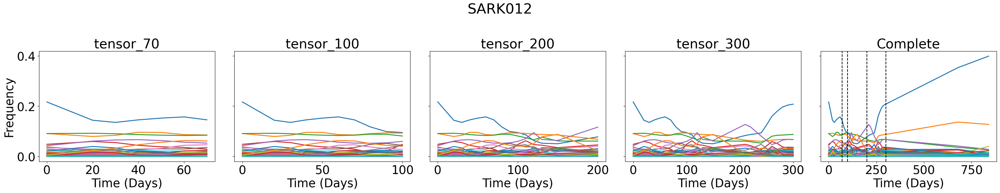

Added SARK012 to plotted_patients
Doing tensor_300 for SARK034
Index of SARK034 in pat_list_group: 1
Shape of tensor_300: (100, 31, 6)


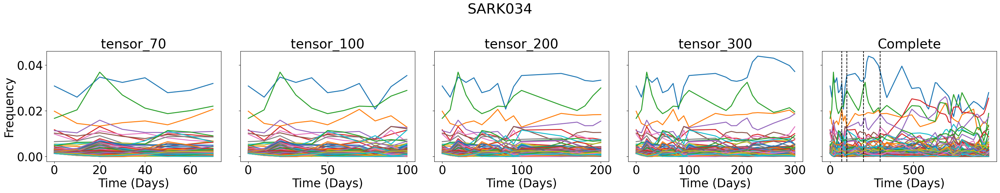

Added SARK034 to plotted_patients
Doing tensor_300 for SARK021
Index of SARK021 in pat_list_group: 2
Shape of tensor_300: (100, 31, 6)


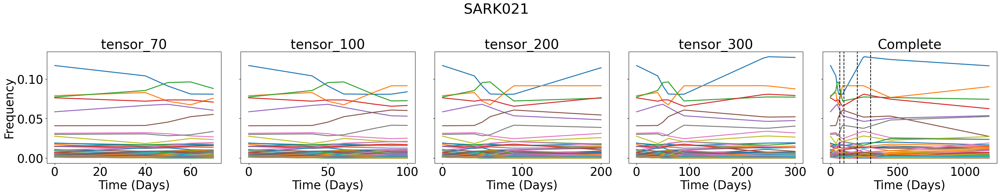

Added SARK021 to plotted_patients
Doing tensor_300 for SARK025
Index of SARK025 in pat_list_group: 3
Shape of tensor_300: (100, 31, 6)


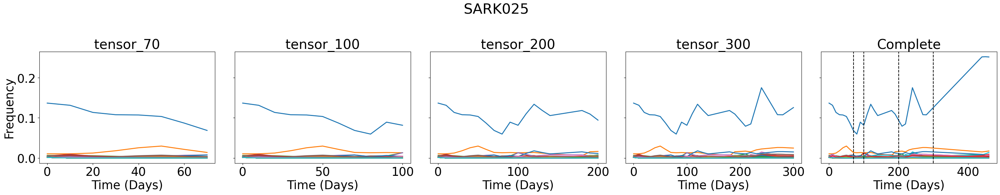

Added SARK025 to plotted_patients
Doing tensor_300 for SARK029
Index of SARK029 in pat_list_group: 4
Shape of tensor_300: (100, 31, 6)


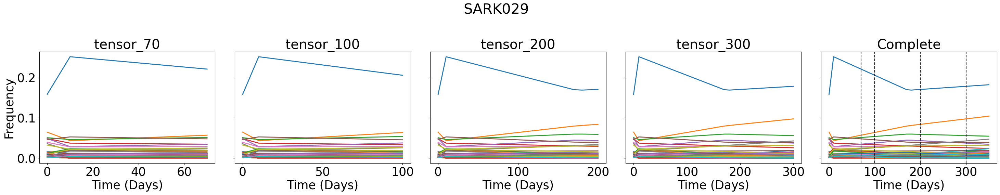

Added SARK029 to plotted_patients
Doing tensor_300 for SARK059
Index of SARK059 in pat_list_group: 5
Shape of tensor_300: (100, 31, 6)


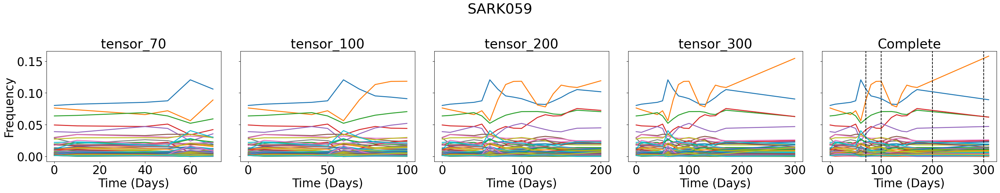

Added SARK059 to plotted_patients
Processing tensor_200
Patient list for tensor_200: ['SARK012', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK027', 'SARK029', 'SARK032', 'SARK059']
Skipping SARK012 (already plotted)
Doing tensor_200 for SARK019
Index of SARK019 in pat_list_group: 1
Shape of tensor_200: (100, 21, 9)


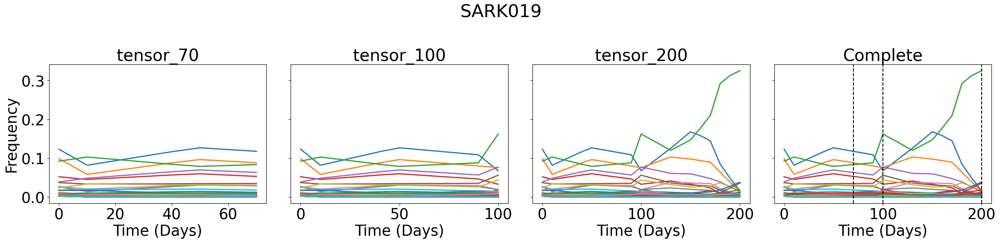

Added SARK019 to plotted_patients
Skipping SARK034 (already plotted)
Skipping SARK021 (already plotted)
Skipping SARK025 (already plotted)
Doing tensor_200 for SARK027
Index of SARK027 in pat_list_group: 5
Shape of tensor_200: (100, 21, 9)


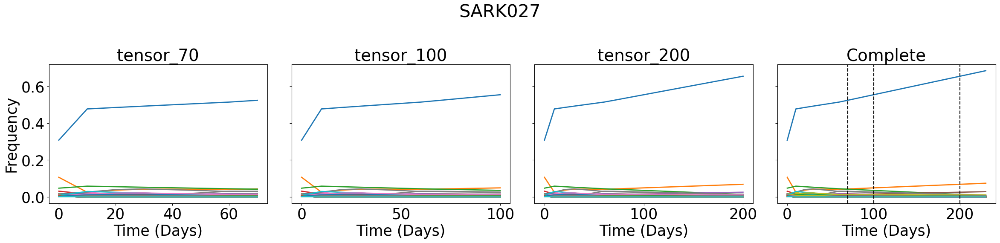

Added SARK027 to plotted_patients
Skipping SARK029 (already plotted)
Doing tensor_200 for SARK032
Index of SARK032 in pat_list_group: 7
Shape of tensor_200: (100, 21, 9)


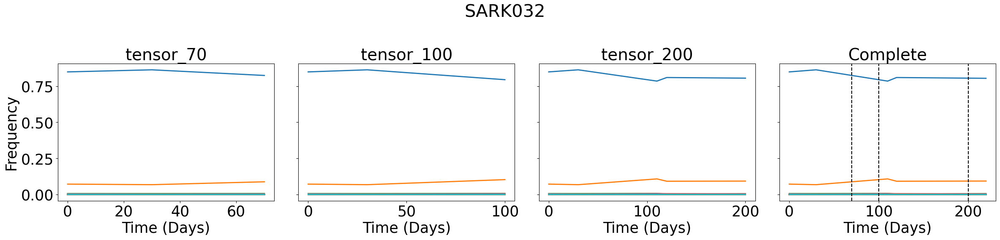

Added SARK032 to plotted_patients
Skipping SARK059 (already plotted)
Processing tensor_100
Patient list for tensor_100: ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK027', 'SARK029', 'SARK032', 'SARK037', 'SARK059']
Skipping SARK012 (already plotted)
Doing tensor_100 for SARK018
Index of SARK018 in pat_list_group: 1
Shape of tensor_100: (100, 11, 11)


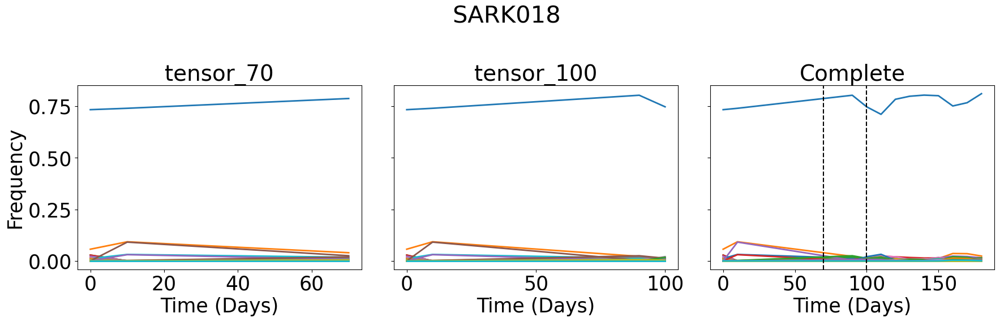

Added SARK018 to plotted_patients
Skipping SARK019 (already plotted)
Skipping SARK034 (already plotted)
Skipping SARK021 (already plotted)
Skipping SARK025 (already plotted)
Skipping SARK027 (already plotted)
Skipping SARK029 (already plotted)
Skipping SARK032 (already plotted)
Doing tensor_100 for SARK037
Index of SARK037 in pat_list_group: 9
Shape of tensor_100: (100, 11, 11)


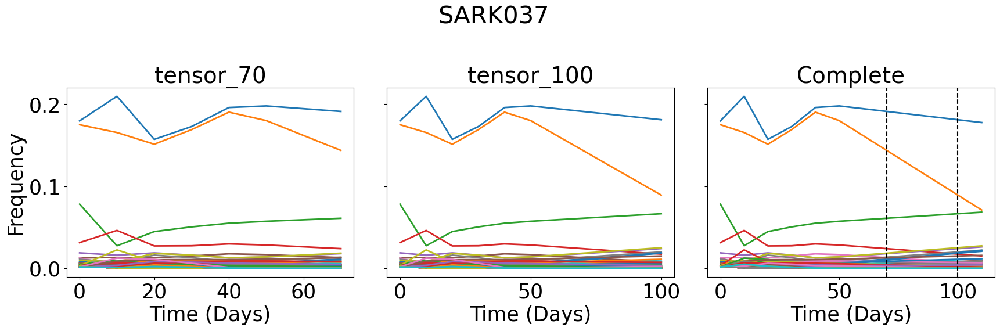

Added SARK037 to plotted_patients
Skipping SARK059 (already plotted)
Processing tensor_70
Patient list for tensor_70: ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK041', 'SARK027', 'SARK029', 'SARK032', 'SARK033', 'SARK037', 'SARK059']
Skipping SARK012 (already plotted)
Skipping SARK018 (already plotted)
Skipping SARK019 (already plotted)
Skipping SARK034 (already plotted)
Skipping SARK021 (already plotted)
Skipping SARK025 (already plotted)
Doing tensor_70 for SARK041
Index of SARK041 in pat_list_group: 6
Shape of tensor_70: (100, 8, 13)


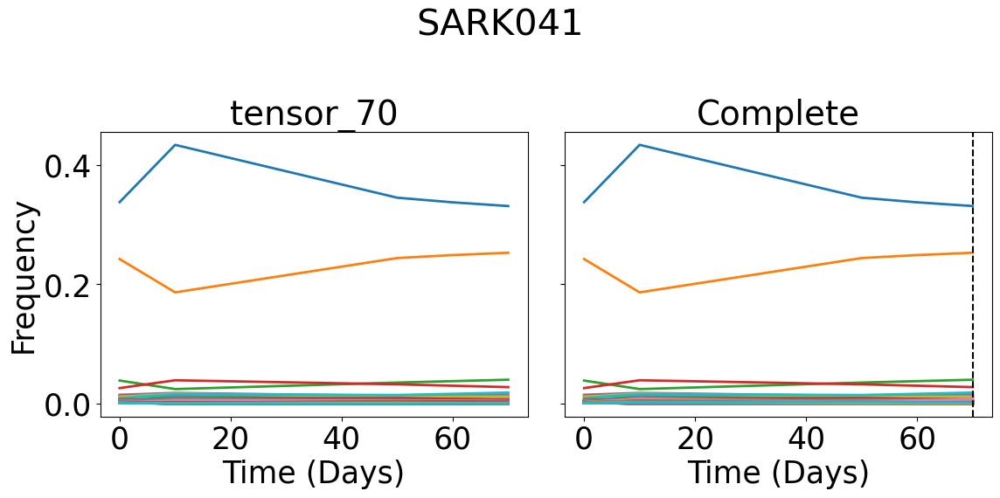

Added SARK041 to plotted_patients
Skipping SARK027 (already plotted)
Skipping SARK029 (already plotted)
Skipping SARK032 (already plotted)
Doing tensor_70 for SARK033
Index of SARK033 in pat_list_group: 10
Shape of tensor_70: (100, 8, 13)


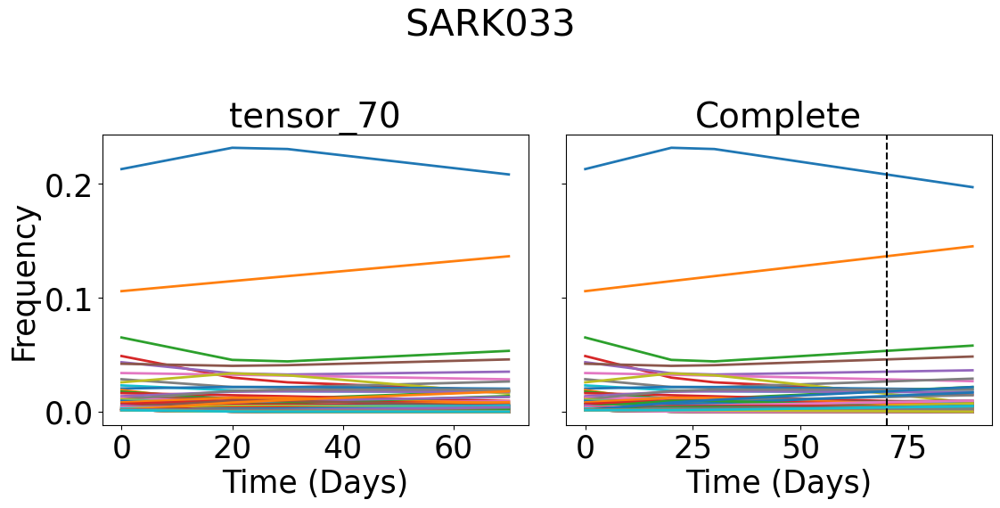

Added SARK033 to plotted_patients
Skipping SARK037 (already plotted)
Skipping SARK059 (already plotted)


In [13]:
# Keep track of already plotted patients
plotted_patients = set()

# Iterate over patient groups in descending order of available time
for time_group, tensor, pat_list_group, available_time_points in [
    (300, tensor_300, pat_list_300, [70, 100, 200, 300]),
    (200, tensor_200, pat_list_200, [70, 100, 200]),
    (100, tensor_100, pat_list_100, [70, 100]),
    (70, tensor_70, pat_list_70, [70])
]:
    
    print(f'Processing tensor_{time_group}')
    print(f'Patient list for tensor_{time_group}: {pat_list_group}')
    
    for pat in pat_list_group:
        if pat in plotted_patients:
            print(f'Skipping {pat} (already plotted)')
            continue  # Skip patients already plotted in a higher time group
        
        print(f'Doing tensor_{time_group} for {pat}')
        try:
            j = pat_list_group.index(pat)  # Get correct tensor index
            print(f'Index of {pat} in pat_list_group: {j}')
            print(f'Shape of tensor_{time_group}: {tensor.shape}')
            plot_patient_time_series_all(tensor[:, :, j], pat, interpolated_original_freq[pat], available_time_points)
        except IndexError as e:
            print(f'IndexError for {pat} in tensor_{time_group}: {e}')
        except KeyError as e:
            print(f'KeyError: Missing data for {pat} in interpolated_recalc_freq: {e}')
        
        # Mark patient as plotted
        plotted_patients.add(pat)
        print(f'Added {pat} to plotted_patients')


## Plot of the data for each tensor

In [14]:
# Set global font sizes
plt.rcParams.update({
    "font.size": 22,        # Default text size
    "axes.titlesize": 22,   # Title size
    "axes.labelsize": 22,   # X and Y label size
    "xtick.labelsize": 20,  # X tick labels
    "ytick.labelsize": 20,  # Y tick labels
    "legend.fontsize": 19,  # Legend text size
    "figure.titlesize": 23,  # Suptitle font size
    "lines.linewidth": 3  # Increase line thickness
})

Processing tensor_300
Patient list for tensor_300: ['SARK012', 'SARK034', 'SARK021', 'SARK025', 'SARK029', 'SARK059']


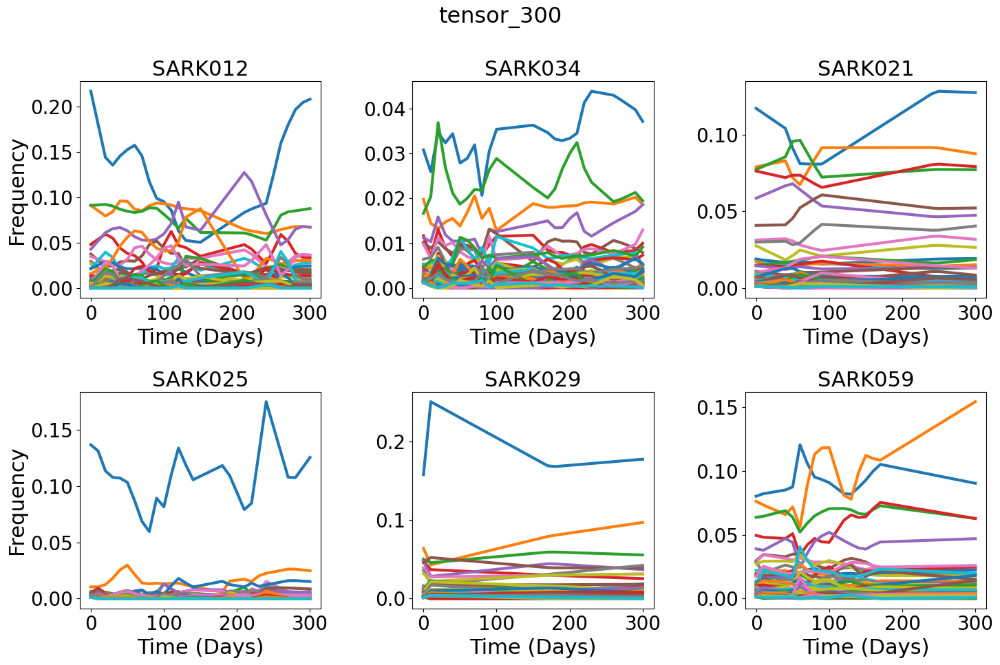

Processing tensor_200
Patient list for tensor_200: ['SARK012', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK027', 'SARK029', 'SARK032', 'SARK059']


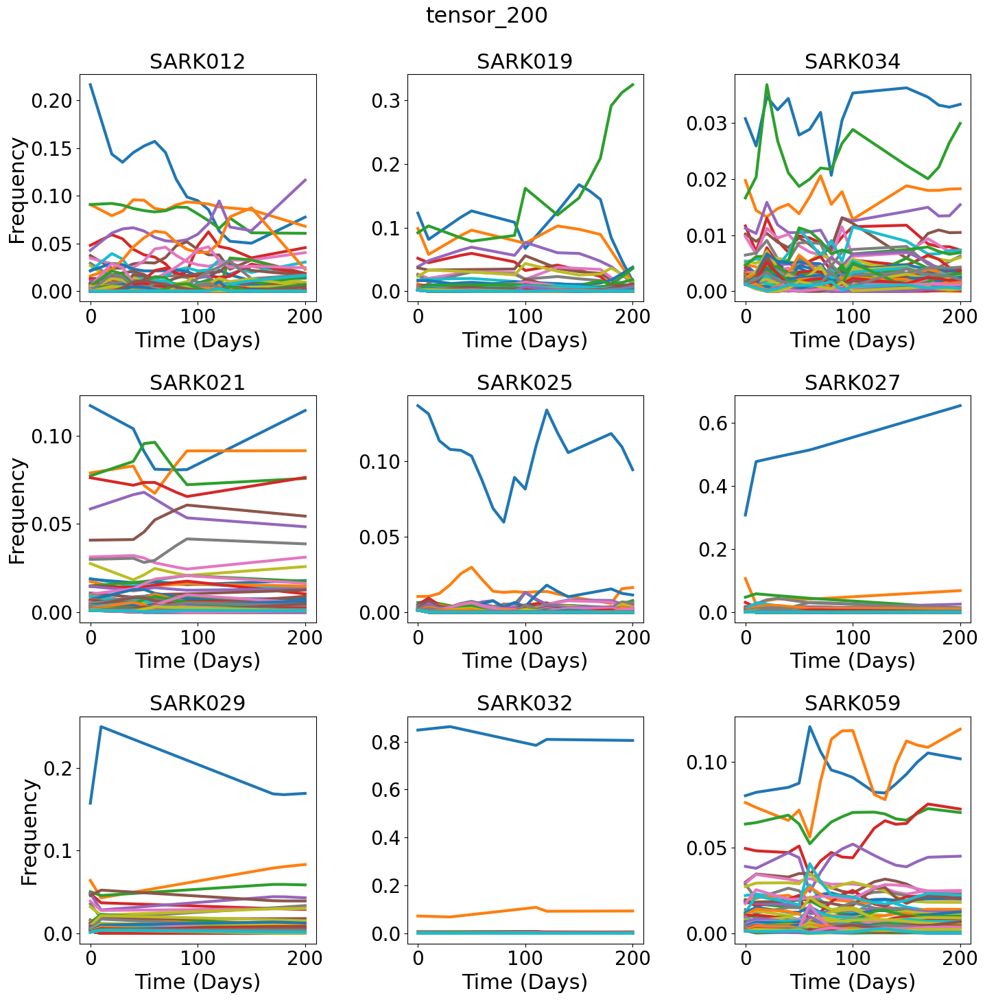

Processing tensor_100
Patient list for tensor_100: ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK027', 'SARK029', 'SARK032', 'SARK037', 'SARK059']


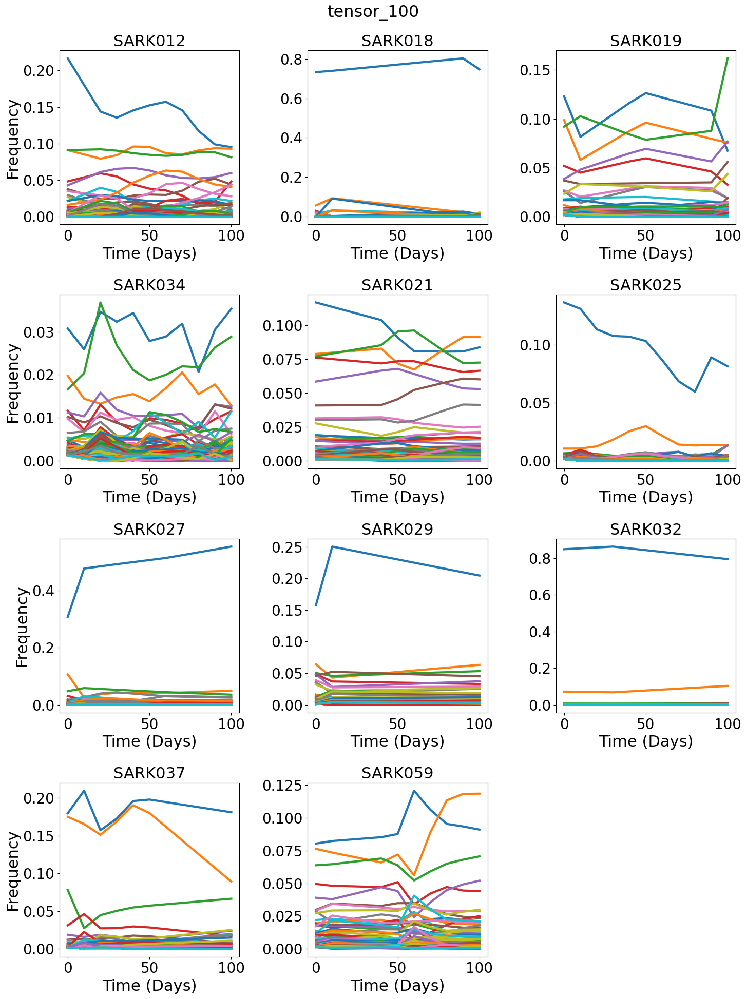

Processing tensor_70
Patient list for tensor_70: ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK041', 'SARK027', 'SARK029', 'SARK032', 'SARK033', 'SARK037', 'SARK059']


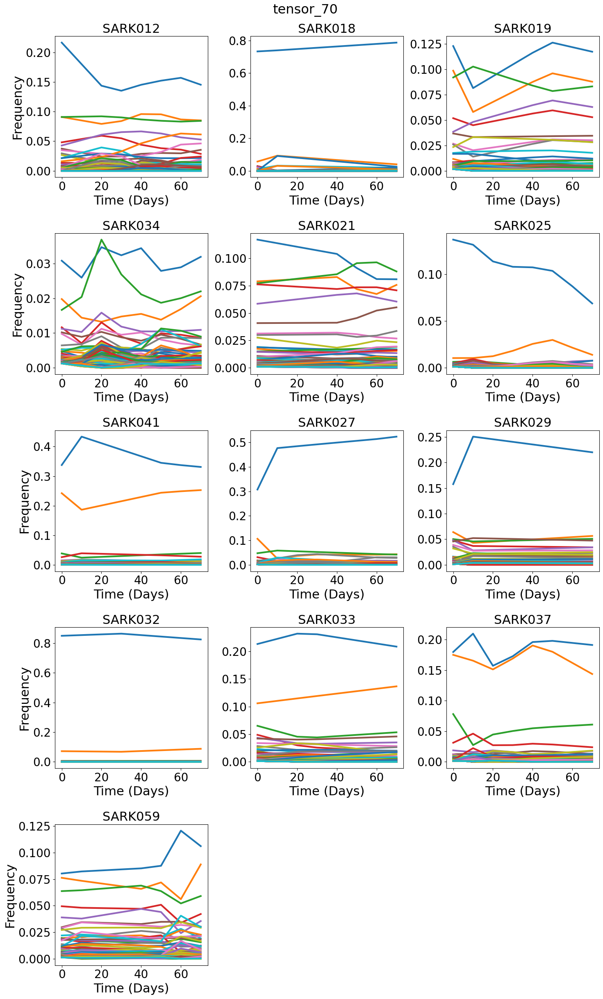

In [15]:
# Keep track of already plotted patients
plotted_patients = set()
pat_list_70 = ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 
                'SARK041', 'SARK027', 'SARK029', 'SARK032', 'SARK033', 'SARK037', 'SARK059']
pat_list_100 =['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 
                'SARK027', 'SARK029', 'SARK032', 'SARK037', 'SARK059']
pat_list_200 = ['SARK012', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 
            'SARK027', 'SARK029', 'SARK032', 'SARK059']
pat_list_300 = ['SARK012', 'SARK034', 'SARK021', 'SARK025', 
            'SARK029', 'SARK059']


# Iterate over patient groups in descending order of available time
for time_group, tensor, pat_list_group, available_time_points in [
    (300, tensor_300, pat_list_300, [70, 100, 200, 300]),
    (200, tensor_200, pat_list_200, [70, 100, 200]),
    (100, tensor_100, pat_list_100, [70, 100]),
    (70, tensor_70, pat_list_70, [70])
]:
    print(f'Processing tensor_{time_group}')
    print(f'Patient list for tensor_{time_group}: {pat_list_group}')
    
    # Plot all patients in the current tensor group together
    plot_time_series_for_all_patients_in_tensor(tensor, pat_list_group, available_time_points, f"tensor_{time_group}")


## Specific sequences per tensor
The next function allows to visualise specific sequences for each tensor and each patient.

Processing tensor_300
Patient list for tensor_300: ['SARK012', 'SARK034', 'SARK021', 'SARK025', 'SARK029', 'SARK059']


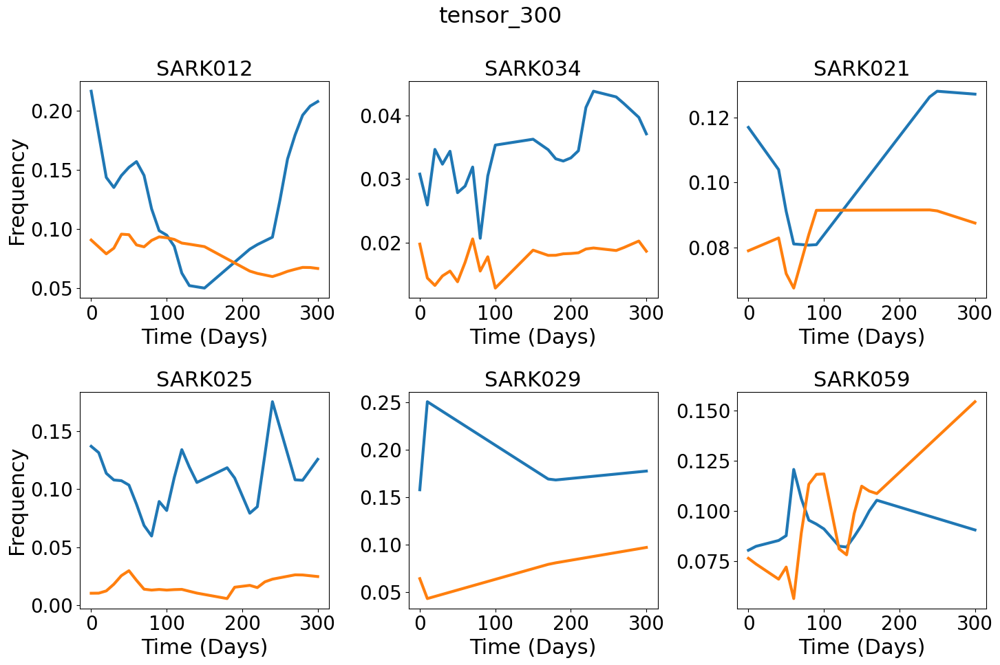

Processing tensor_200
Patient list for tensor_200: ['SARK012', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK027', 'SARK029', 'SARK032', 'SARK059']


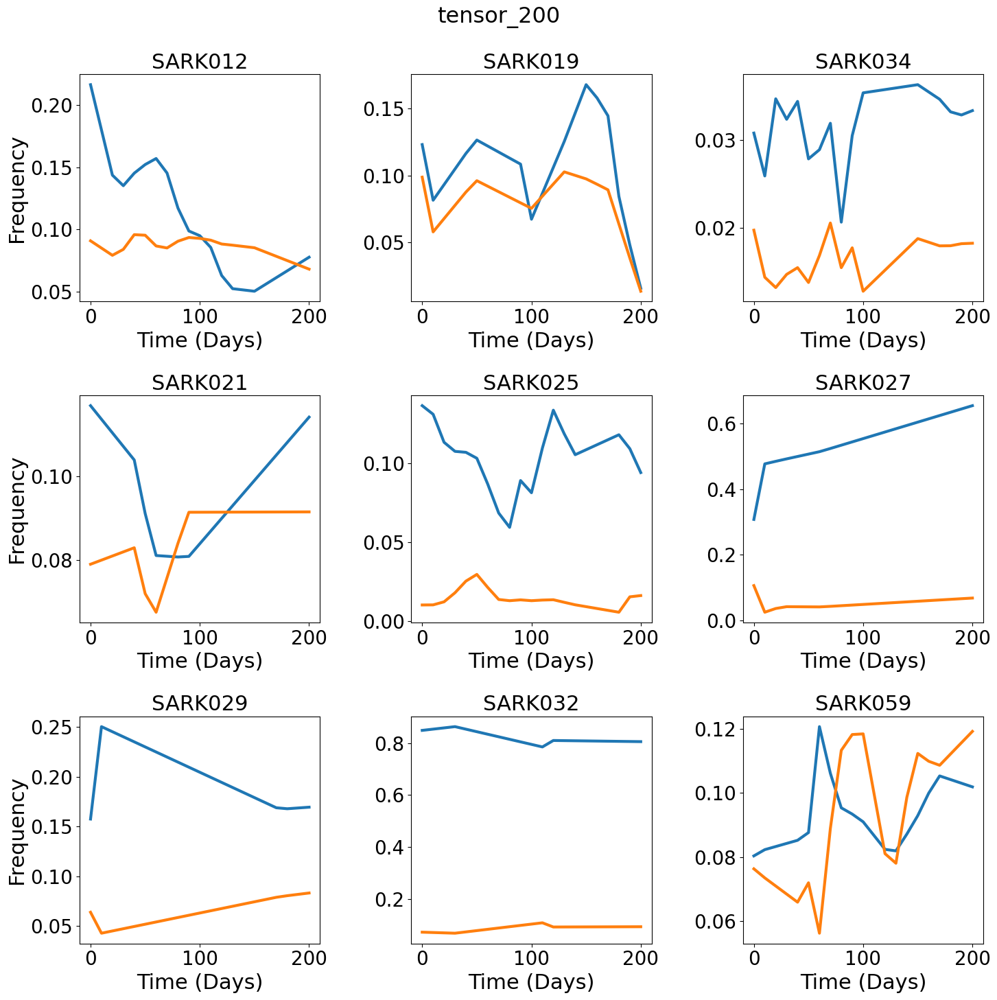

Processing tensor_100
Patient list for tensor_100: ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK027', 'SARK029', 'SARK032', 'SARK037', 'SARK059']


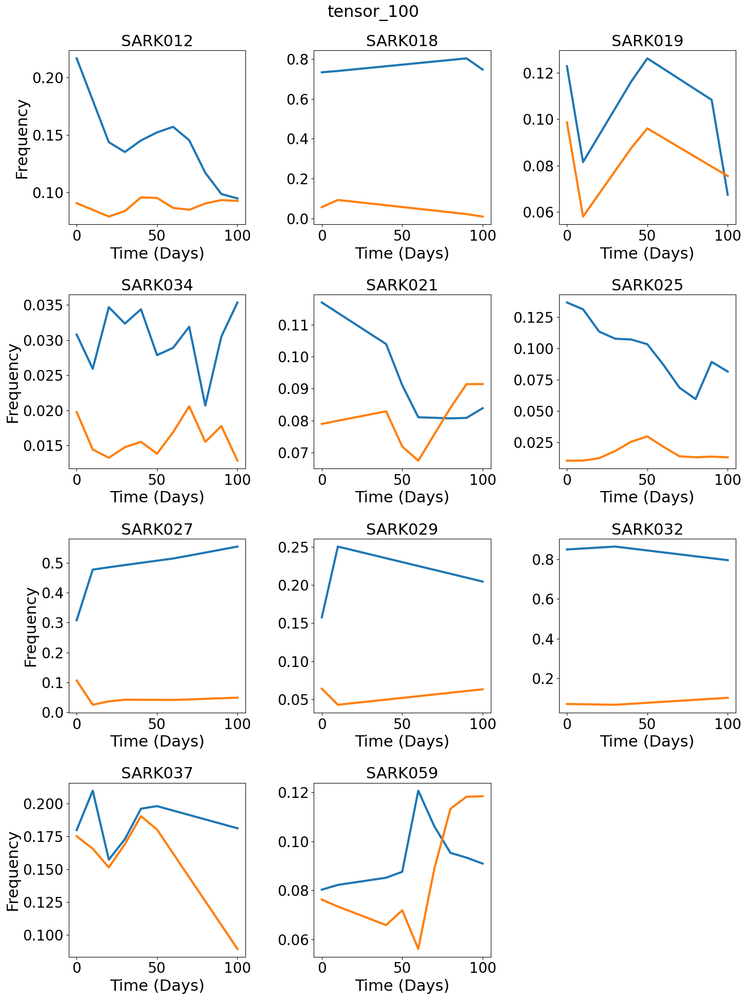

Processing tensor_70
Patient list for tensor_70: ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK021', 'SARK025', 'SARK041', 'SARK027', 'SARK029', 'SARK032', 'SARK033', 'SARK037', 'SARK059']


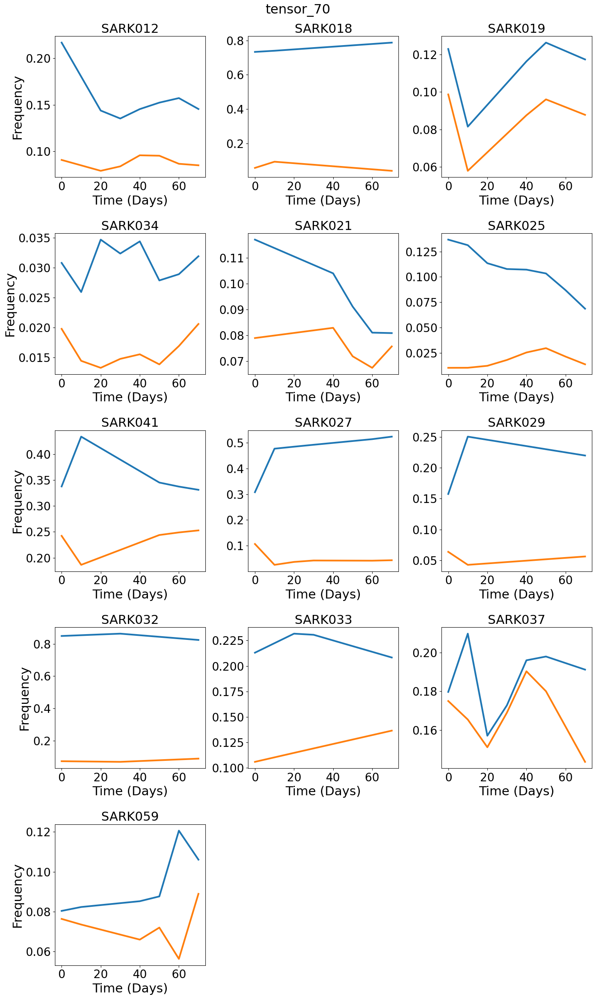

In [16]:

# Iterate over patient groups in descending order of available time
for time_group, tensor, pat_list_group, available_time_points in [
    (300, tensor_300, pat_list_300, [70, 100, 200, 300]),
    (200, tensor_200, pat_list_200, [70, 100, 200]),
    (100, tensor_100, pat_list_100, [70, 100]),
    (70, tensor_70, pat_list_70, [70])
]:
    print(f'Processing tensor_{time_group}')
    print(f'Patient list for tensor_{time_group}: {pat_list_group}')
    
    # Plot all patients in the current tensor group together
    plot_time_series_for_all_patients_in_tensor(tensor, pat_list_group, available_time_points, f"tensor_{time_group}",log_axis=False,specific_seq=[0,1])


## Data + Treatment

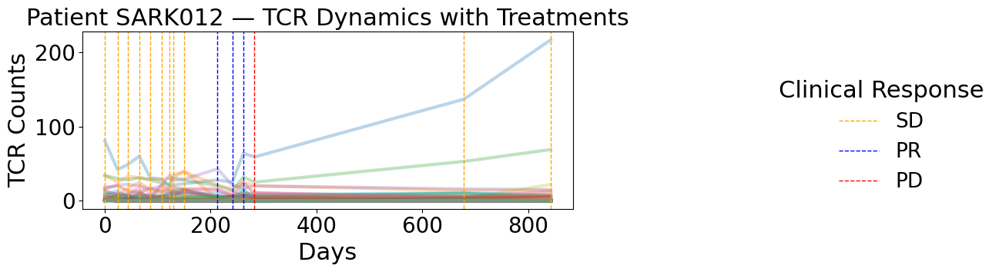

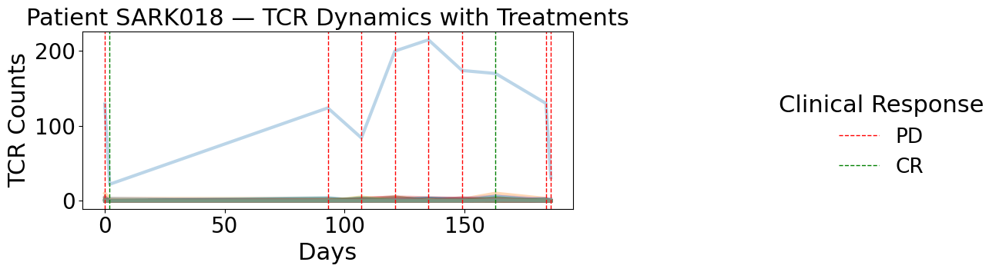

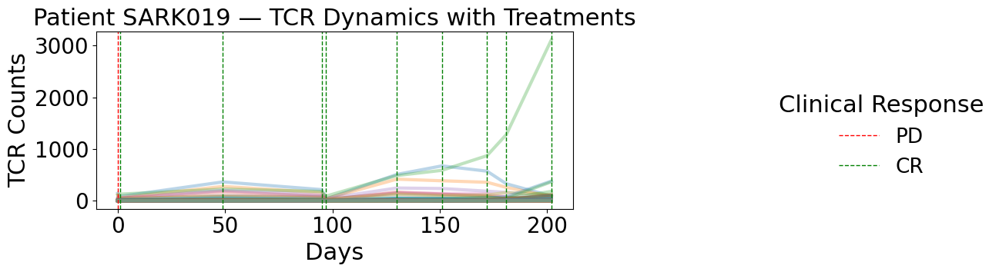

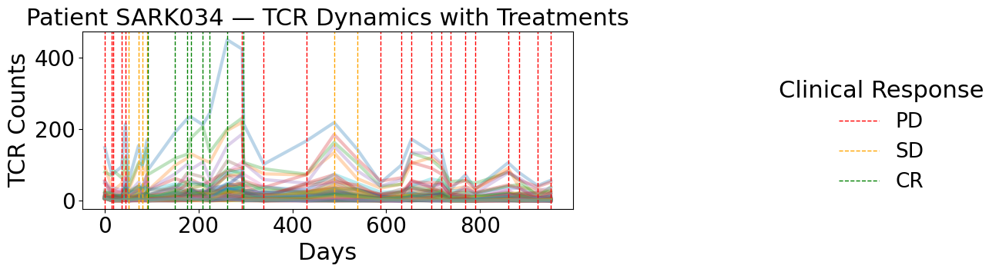

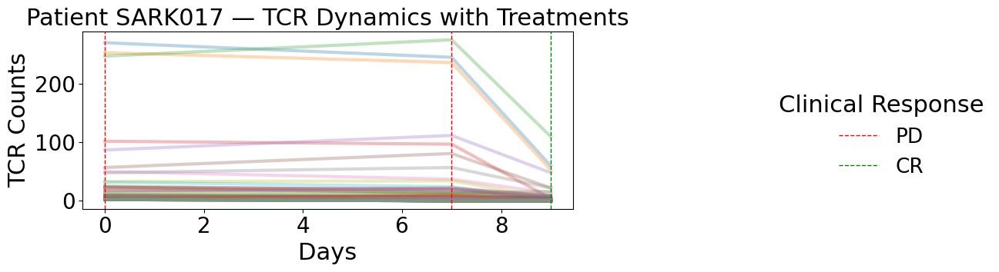

...

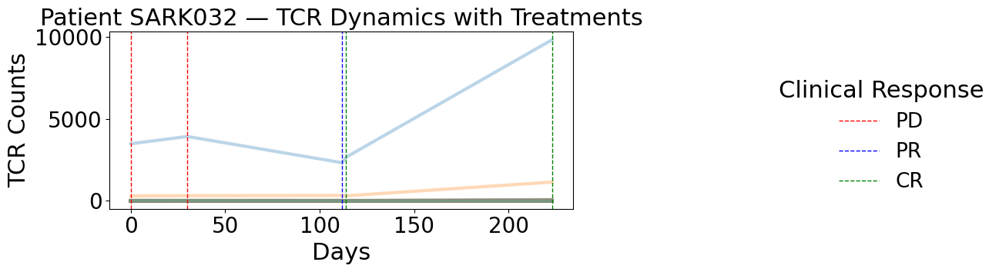

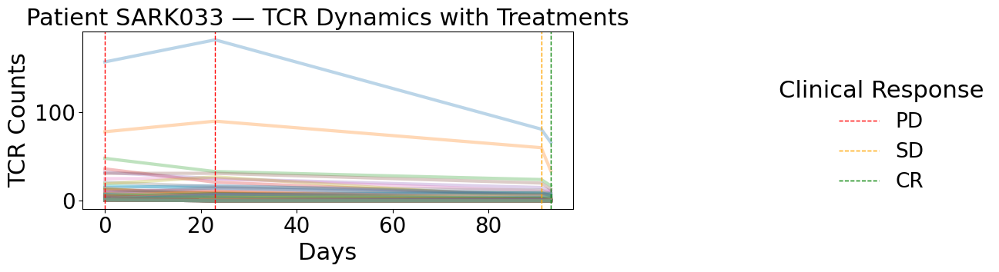

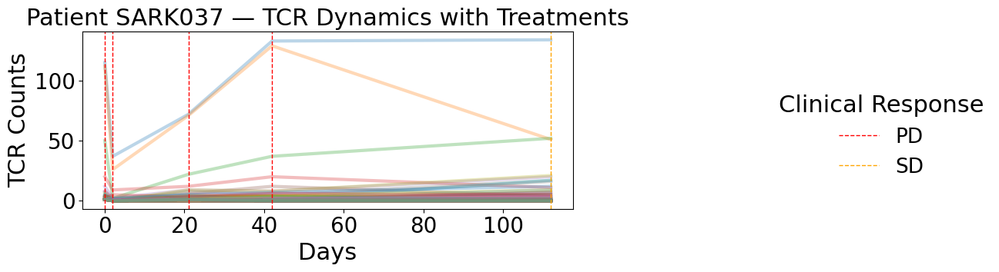

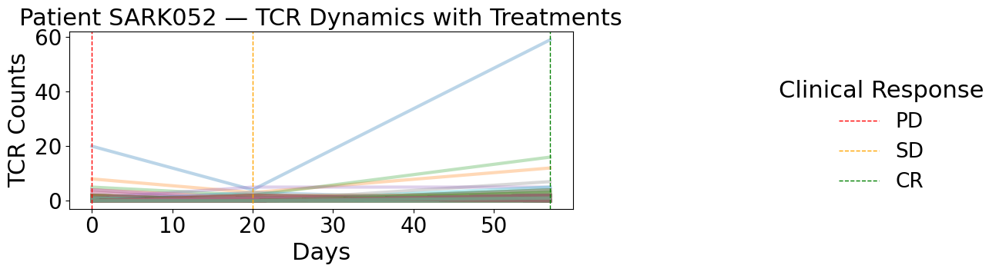

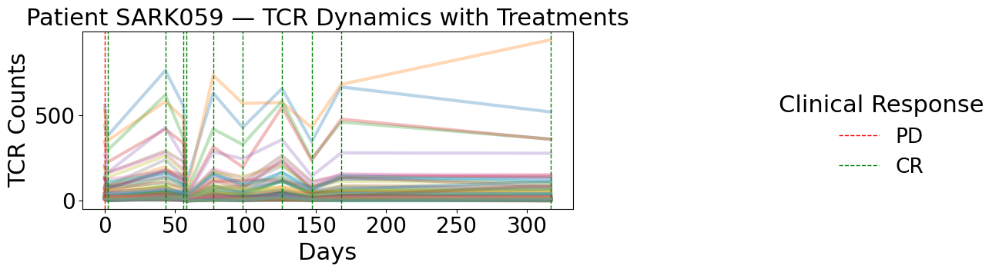

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle

# --- Load clinical outcome data ---
clinical_df = pd.read_excel("Clinical info_v2.2.xlsx", sheet_name=1)

# --- Load TCR sequencing data ---
with open("all_counts_100.pkl", "rb") as f:
    all_counts_100 = pickle.load(f)

# --- Color map for clinical response ---
response_colors = {
    'CR': 'green',   # Complete Response
    'PR': 'blue',    # Partial Response
    'SD': 'orange',  # Stable Disease
    'PD': 'red'      # Progressive Disease
}

# --- Plot for each patient ---
for patient_id, df in all_counts_100.items():
    fig, ax = plt.subplots(1, 1, figsize=(10, 4))  # Use subplots for consistency

    # Plot all TCR sequences for the patient
    for tcr_id in df['id'].unique():
        sub_df = df[df['id'] == tcr_id]
        ax.plot(sub_df['time'], sub_df['counts'], alpha=0.3)

    # Overlay treatment days with color-coded outcome
    patient_clinical = clinical_df[clinical_df['Patient_id'] == patient_id]
    seen_responses = set()
    
    for _, row in patient_clinical.iterrows():
        day = row['Days']
        response = row['Clinical response']
        color = response_colors.get(response, 'gray')
        label = response if response not in seen_responses else None
        ax.axvline(x=day, linestyle='--', color=color, linewidth=1, label=label)
        seen_responses.add(response)

    # Plot styling
    ax.set_title(f"Patient {patient_id} — TCR Dynamics with Treatments")
    ax.set_xlabel("Days")
    ax.set_ylabel("TCR Counts")

    # Collect and deduplicate legend entries
    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))  # Keeps last occurrence

    # Add external legend to the right
    fig.legend(unique.values(), unique.keys(),
               title="Clinical Response",
               bbox_to_anchor=(1.01, 0.5), loc="center left", frameon=False)

    # Adjust layout to leave space for legend
    plt.tight_layout(rect=[0, 0, 0.8, 1])
    
    # Save figure
    save_figure(fig, f'{patient_id}_data_with_treatment', foldername=None)
    plt.show()


## Metrics + Treatment

C:\Users\viola\AppData\Local\Temp\ipykernel_25236\2851704991.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  metric_color_map = dict(zip(all_metrics, cm.get_cmap("tab10")(np.linspace(0, 1, len(all_metrics)))))


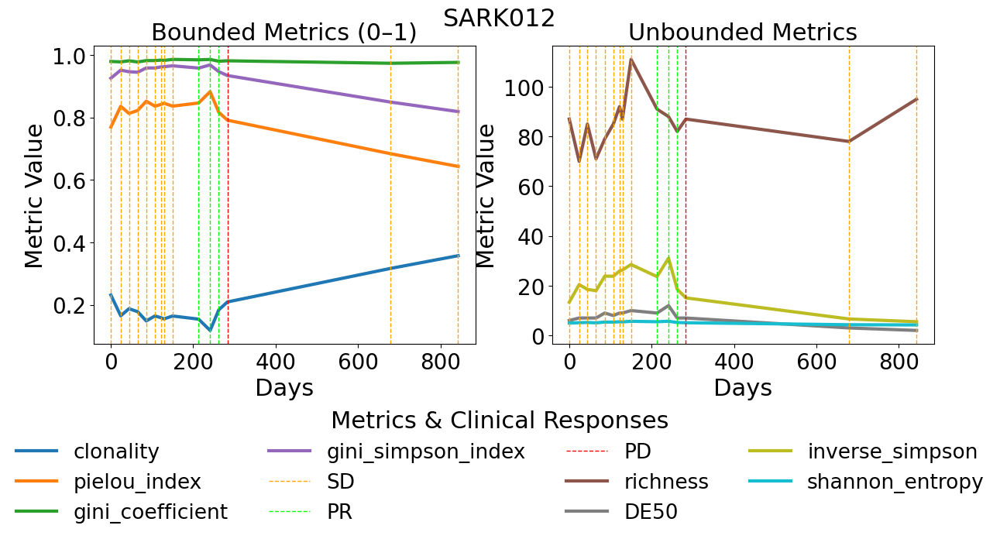

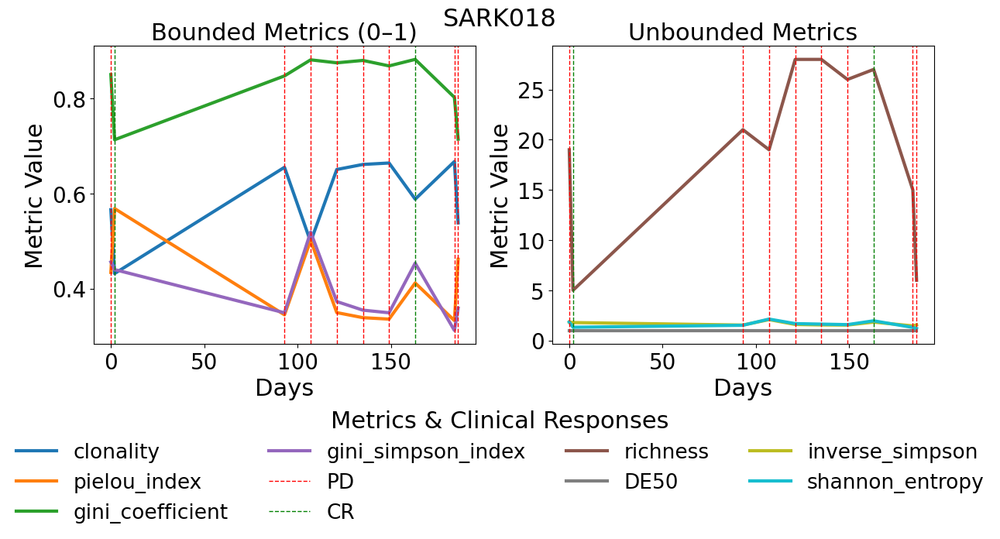

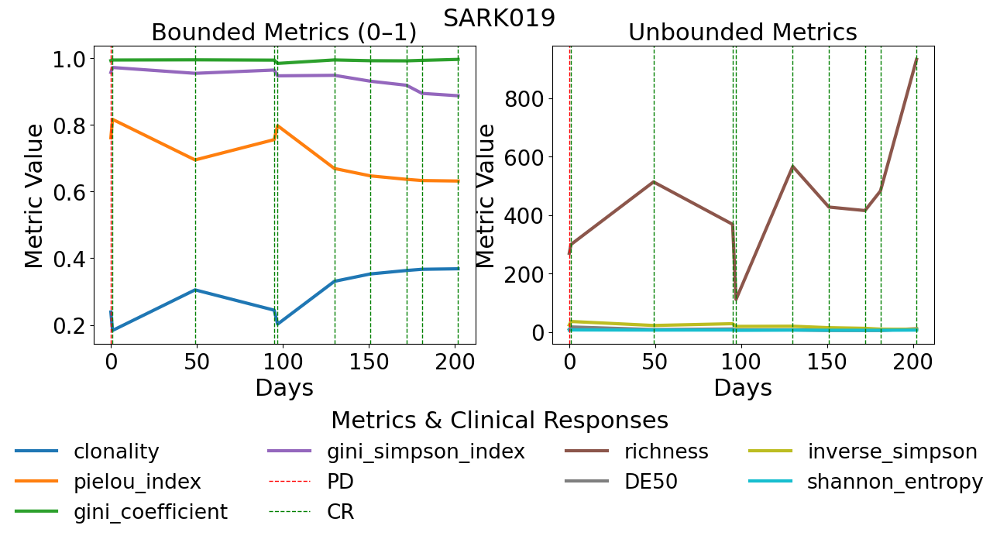

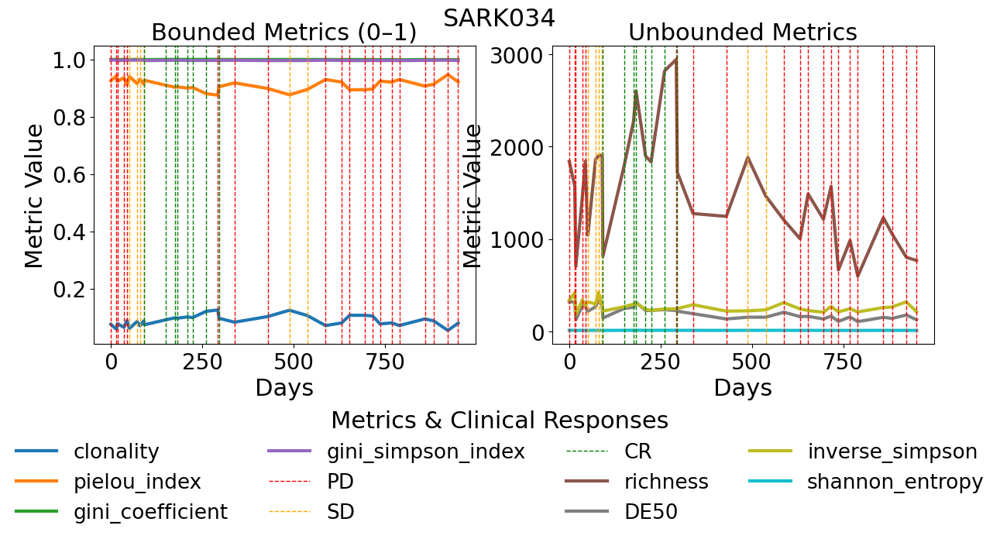

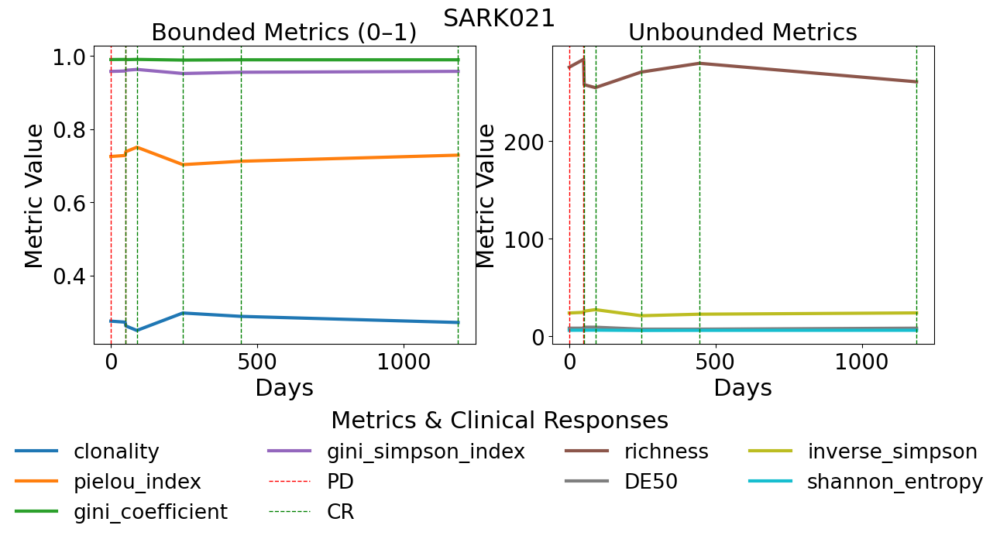

...

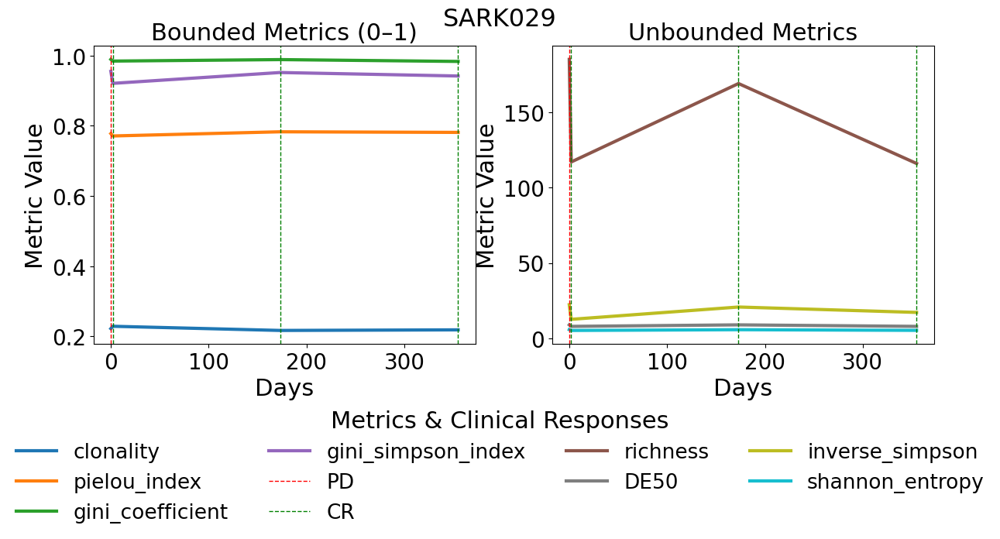

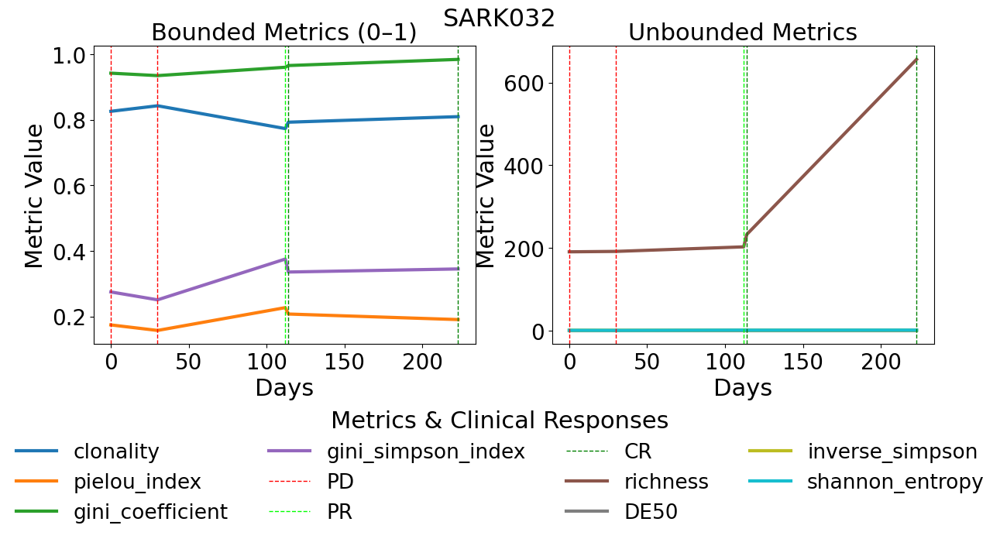

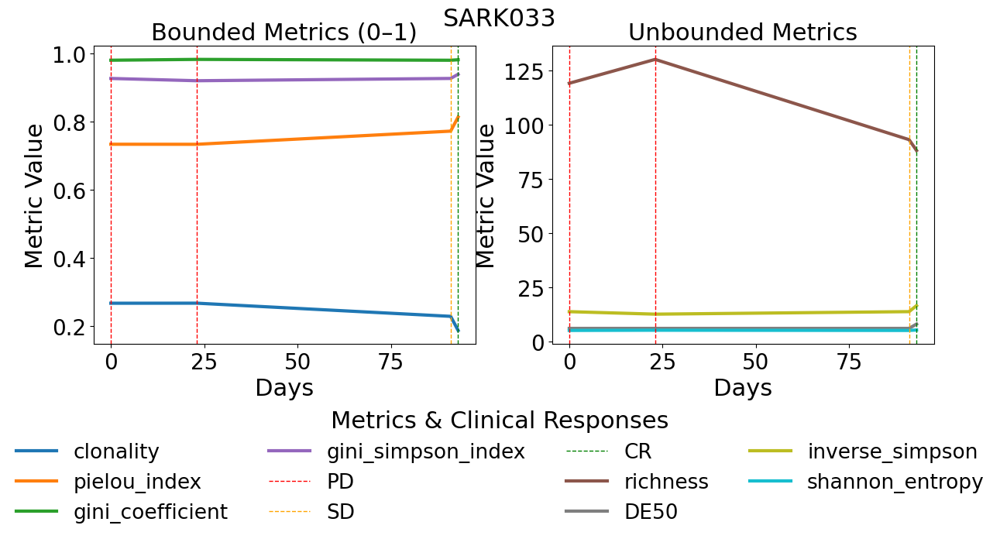

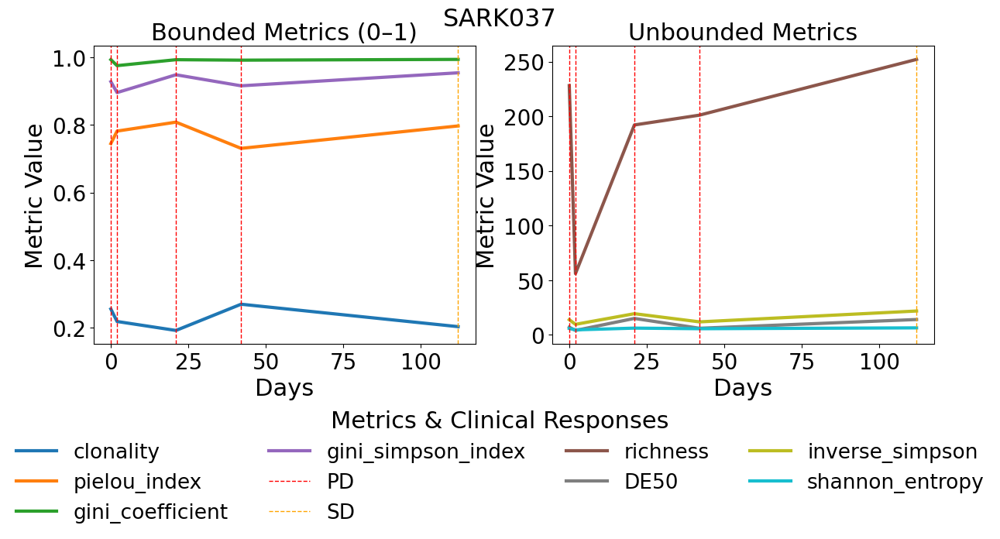

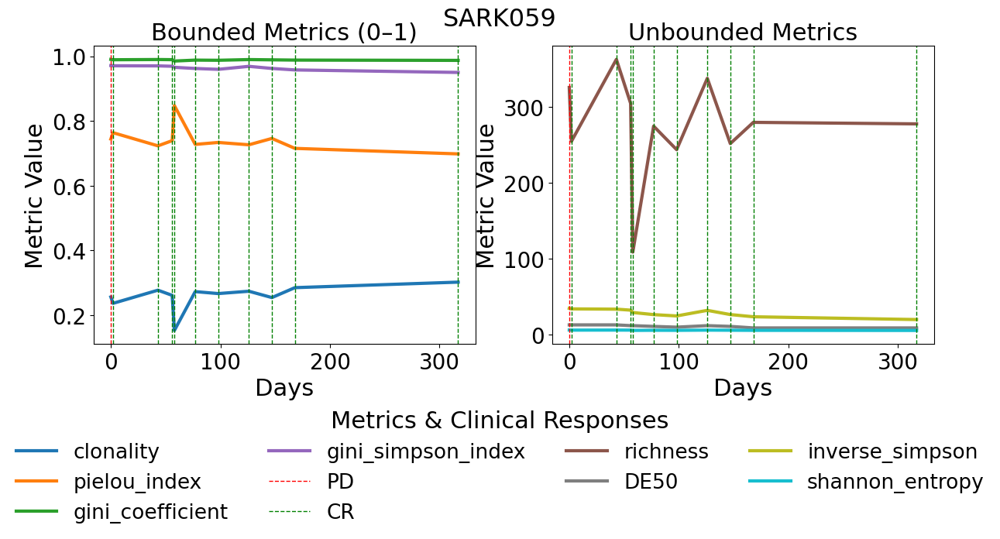

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import matplotlib.cm as cm
import numpy as np

# --- Load clinical outcome data ---
clinical_df = pd.read_excel("Clinical info_v2.2.xlsx", sheet_name=1)

# --- Load metrics dictionary ---
with open("metrics_dict.pkl", "rb") as f:
    metrics_dict = pickle.load(f)

# --- Define metric groups ---
bounded_metrics = ['clonality', 'pielou_index', 'gini_coefficient', 'gini_simpson_index']
unbounded_metrics = ['richness', 'DE50', 'inverse_simpson', 'shannon_entropy']

# --- Color map for clinical response ---
response_colors = {
    'CR': 'green',
    'PR': 'lime',
    'SD': 'orange',
    'PD': 'red'
}

# --- Unique metrics for consistent coloring ---
all_metrics = bounded_metrics + unbounded_metrics
metric_color_map = dict(zip(all_metrics, cm.get_cmap("tab10")(np.linspace(0, 1, len(all_metrics)))))

# --- Plot for each patient ---
for patient_id, df in metrics_dict.items():
    fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharex=True)
    
    # Track legend entries
    plotted_labels = set()

    for ax, metric_group, title in zip(
        axes,
        [bounded_metrics, unbounded_metrics],
        ["Bounded Metrics (0–1)", "Unbounded Metrics"]
    ):
        for metric in metric_group:
            metric_df = df[df['metric_name'] == metric]
            if not metric_df.empty:
                ax.plot(metric_df['time'], metric_df['value'],
                        label=metric, color=metric_color_map[metric])
        
        # Treatment lines
        patient_clinical = clinical_df[clinical_df['Patient_id'] == patient_id]
        for _, row in patient_clinical.iterrows():
            day = row['Days']
            response = row['Clinical response']
            color = response_colors.get(response, 'gray')
            label = response if response not in plotted_labels else None
            ax.axvline(x=day, linestyle='--', color=color, linewidth=1, label=label)
            plotted_labels.add(response)

        ax.set_title(title)
        ax.set_xlabel("Days")
        ax.set_ylabel("Metric Value")
    
    # Overall title
    fig.suptitle(f"{patient_id}")

    # Combine legends from both subplots
    handles_labels = [ax.get_legend_handles_labels() for ax in axes]
    all_handles = sum([hl[0] for hl in handles_labels], [])
    all_labels = sum([hl[1] for hl in handles_labels], [])

    # Remove duplicate labels
    unique = dict(zip(all_labels, all_handles))  # keeps last occurrence

    # fig.legend(unique.values(), unique.keys(),
    #         title="Metrics & Clinical Responses",
    #         bbox_to_anchor=(1.02, 0.5), loc="center left")
    # Gather all handles and labels from both subplots
    handles, labels = [], []
    for ax in axes:
        h, l = ax.get_legend_handles_labels()
        for handle, label in zip(h, l):
            if label not in labels:  # Avoid duplicates
                handles.append(handle)
                labels.append(label)
    fig.legend(handles, labels,
           title="Metrics & Clinical Responses",
           loc="lower center",
           bbox_to_anchor=(0.5, -0.4),
           ncol=4, frameon=False)

    # plt.tight_layout(rect=[0, 0, 0.85, 1])
    save_figure(fig, f'{patient_id}_metrics_with_treatment',foldername=None)
    
    plt.show()

